In [1]:
import h5py

In [2]:
import numpy

In [11]:
import matplotlib.pyplot as plt
%pylab inline

Populating the interactive namespace from numpy and matplotlib


/home/siyan/anaconda3/lib/python3.6/site-packages/IPython/core/magics/pylab.py:160: UserWarning: pylab import has clobbered these variables: ['f']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


In [5]:
cd ..

/home/siyan/projects/cluster


In [73]:
with h5py.File('data/cremi/images/im_A_v2_200.h5') as f:
    img_A = f['main'][:]

In [72]:
with h5py.File('data/cremi/gt-syn/syn_A_v2_200.h5') as f:
    mask_A = f['main'][:]

In [7]:
img_A.shape

(153, 1842, 1727)

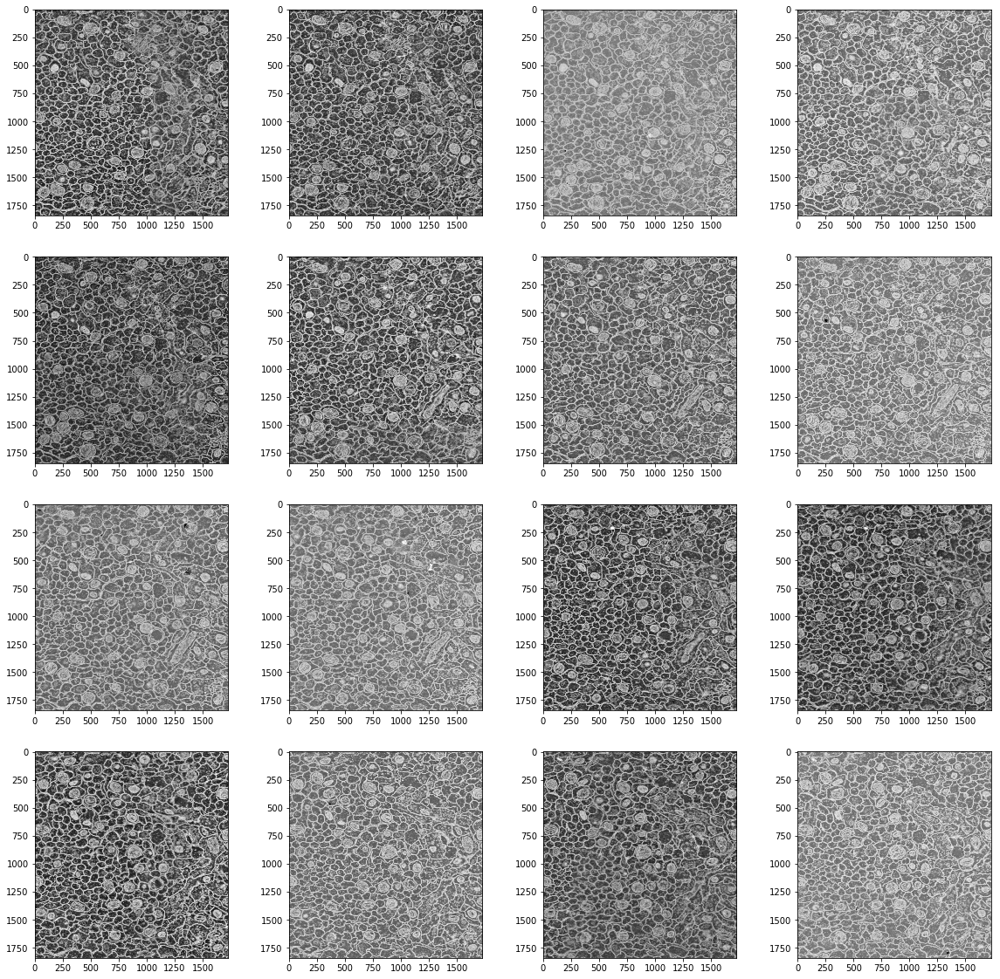

In [15]:
fig,ax = plt.subplots(4,4,figsize = (20,20))
for i in range(4):
    for j in range(4):
        ax[i,j].imshow(img_A[10+4*i+j],cmap=cm.Greys)

### Keys

Volumes

The volumes are stored in row-major format, i.e., with dimensions (depth,height,width). All volumes have an attribute resolution that specifies the size of voxels (depth,height,width) in nm. In the padded versions of the datasets, the raw volume provides much more context. In this case, the label volumes have an additional offset attribute (z,y,x) in nm that marks the beginning of the label volumes in the raw volume.

- volumes/raw
    gray scale pixels
- volumes/labels/clefts
    synaptic cleft segmentation
- volumes/labels/neuron_ids
    neuron segmentation

Annotations

Annotations for pre- and post-synaptic partner pairs are provided as well. All locations are given as (z,y,x) in nm. In the padded versions of the datasets, the raw volume provides much more context. In this case, the annotation group has an additional offset attribute (z,y,x) in nm, which is the same as for the label volumes. All locations are relative to this offset, such that they are the same as in the unpadded version.

- annotations/ids
    list of ids
- annotations/locations
    list of annotation locations as (z,y,x) in nm, same order as ids
- annotations/type???
    list of annotation types (presynaptic_site or postsynaptic_site), same order as ids
- presynaptic_site/partners
    list of id tuples (pre, post) linking pre- and postsynaptic partners
- comments/target_ids
    list of ids for annotations that have a comment
- comments/comments
    list of comments, same order as target_ids 

In [44]:
with h5py.File('data/public/sample_A_padded_20160501.hdf') as f:
    print (list(f['annotations'].keys()))

['comments', 'ids', 'locations', 'presynaptic_site', 'types']


In [64]:
with h5py.File('data/public/sample_A_padded_20160501.hdf') as f:
    annoidsA = f['annotations/ids'][:]
    locationA = f['annotations/locations'][:]
    presynapsesiteA = f['annotations/presynaptic_site/partners'][:]
    targetidA = f['annotations/comments/target_ids'][:]
    commentsA = f['annotations/comments/comments'][:]
    #print (list(f['annotations/presynaptic_site']))

In [65]:
commentsA

array(['unsure', 'unsure', 'unsure', 'unsure', 'unsure', 'unsure',
       'unsure', 'unsure', 'unsure', 'unsure', 'unsure', 'unsure',
       'unsure', 'unsure', 'unsure', 'unsure', 'unsure'], dtype=object)

In [63]:
targetidA

array([165, 167, 185, 191, 347, 389, 403, 405, 409, 425, 450, 468, 484,
       524, 568, 574, 576], dtype=uint64)

In [60]:
np.sum(presynapsesiteA -annoidsA.reshape(-1,2))

0

In [38]:
locationA[np.argsort(locationA[:,0])]/40

array([[  0.       ,  45.82115  ,  94.33835  ],
       [  0.       ,  44.839226 ,  90.874825 ],
       [  0.       ,  42.59788  ,  93.76875  ],
       ...,
       [119.       ,  93.36052  ,  99.39958  ],
       [120.       ,   3.7718124, 112.94265  ],
       [120.       ,   5.2691617, 117.2177   ]], dtype=float32)

In [36]:
np.unique(locationA[:,0],return_counts=True)

(array([   0.,   40.,   80.,  120.,  160.,  200.,  320.,  360.,  400.,
         440.,  480.,  520.,  560.,  600.,  640.,  680.,  720.,  800.,
         840.,  920.,  960., 1000., 1080., 1120., 1160., 1200., 1280.,
        1360., 1400., 1440., 1520., 1560., 1640., 1720., 1760., 1800.,
        1840., 1880., 1920., 1960., 2000., 2040., 2080., 2120., 2160.,
        2200., 2240., 2280., 2320., 2360., 2400., 2480., 2520., 2560.,
        2600., 2640., 2680., 2760., 2800., 2880., 2960., 3040., 3080.,
        3120., 3160., 3240., 3320., 3360., 3400., 3440., 3480., 3520.,
        3560., 3640., 3680., 3720., 3760., 3840., 3880., 3920., 4040.,
        4080., 4120., 4200., 4240., 4320., 4360., 4400., 4440., 4480.,
        4520., 4600., 4640., 4680., 4720., 4760., 4800.], dtype=float32),
 array([12, 10,  9,  7,  2,  4,  2,  2,  6, 10,  4,  4,  8,  1,  3,  5,  3,
         2,  2,  1,  8, 11, 10,  4,  2,  4, 12,  4,  2,  2,  1,  5,  2,  6,
         2,  2,  4,  9,  3,  2,  3,  1,  8,  7,  1,  7,  1,  2, 

In [66]:
np.sum(np.unique(locationA[:,0],return_counts=True)[1])

432

In [41]:
cleftsA.shape

(125, 1250, 1250)

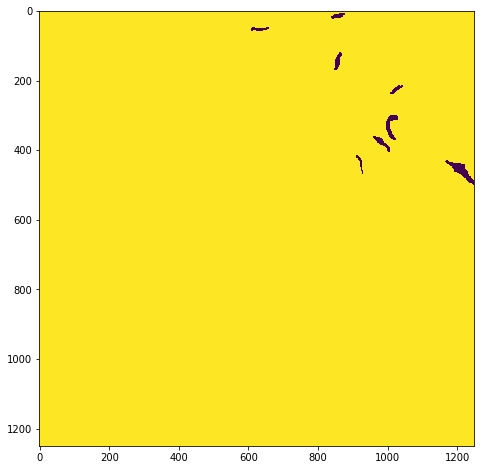

In [67]:
fig,ax = plt.subplots(1,figsize = (8,8))
ax.imshow(cleftsA[0])

**public**

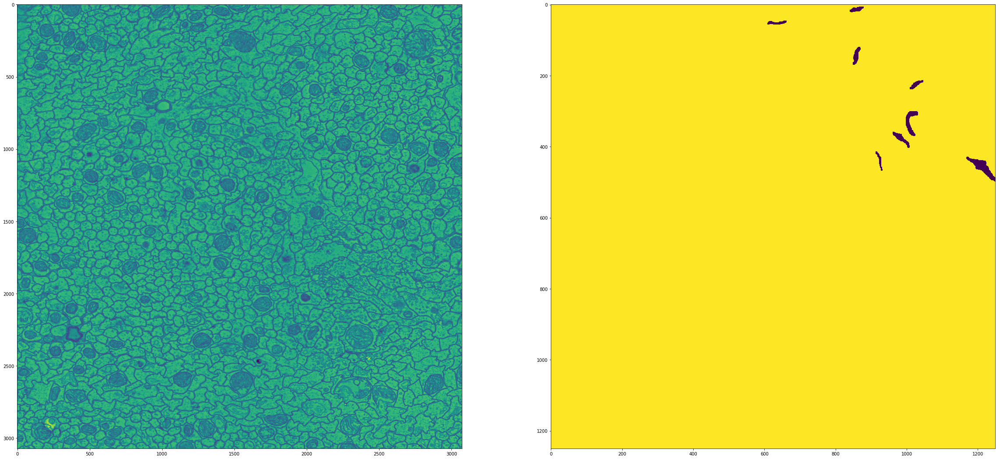

In [75]:
fig,ax = plt.subplots(1,2,figsize = (40,20))
ax[0].imshow(rawA[0])
ax[1].imshow(cleftsA[0])

**donglai**

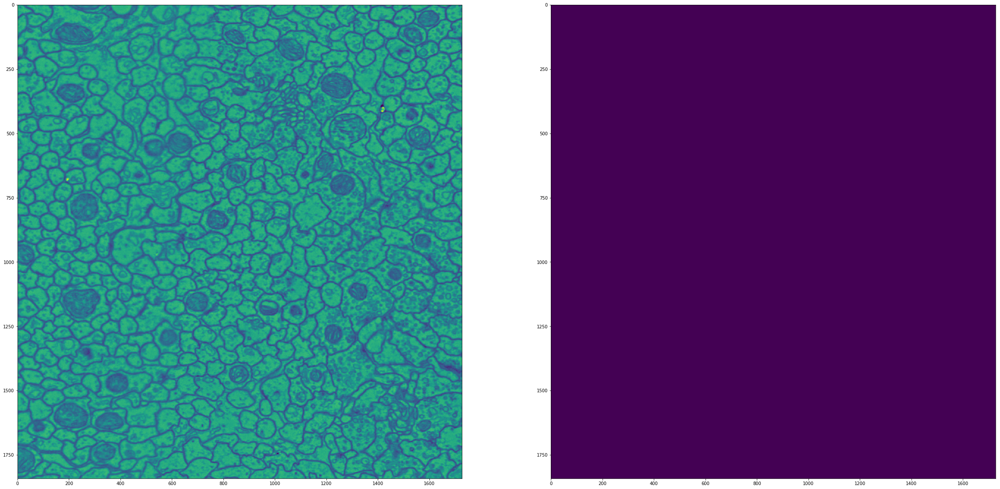

In [79]:
fig,ax = plt.subplots(1,2,figsize = (40,20))
ax[0].imshow(img_A[0])
ax[1].imshow(mask_A[0])

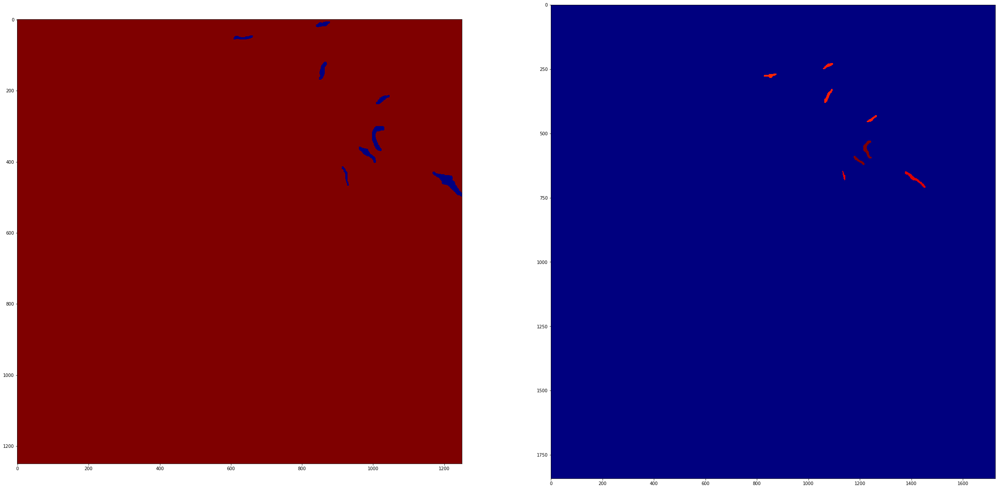

In [86]:
fig,ax = plt.subplots(1,2,figsize = (40,20))
ax[0].imshow(cleftsA[0],cmap='jet')
ax[1].imshow(mask_A[15],cmap='jet')

In [83]:
np.unique(mask_A[15],return_counts=True)

(array([  0, 746, 754, 755, 756, 781, 788, 857, 858], dtype=uint16),
 array([3176771,     463,     575,     385,     363,     190,     984,
            471,     932]))

In [85]:
np.unique(cleftsA[0],return_counts=True)

(array([                 746,                  754,                  755,
                         756,                  781,                  788,
                         857,                  858, 18446744073709551615],
       dtype=uint64),
 array([    417,     602,     401,     422,     339,    1753,     708,
           1093, 1556765]))

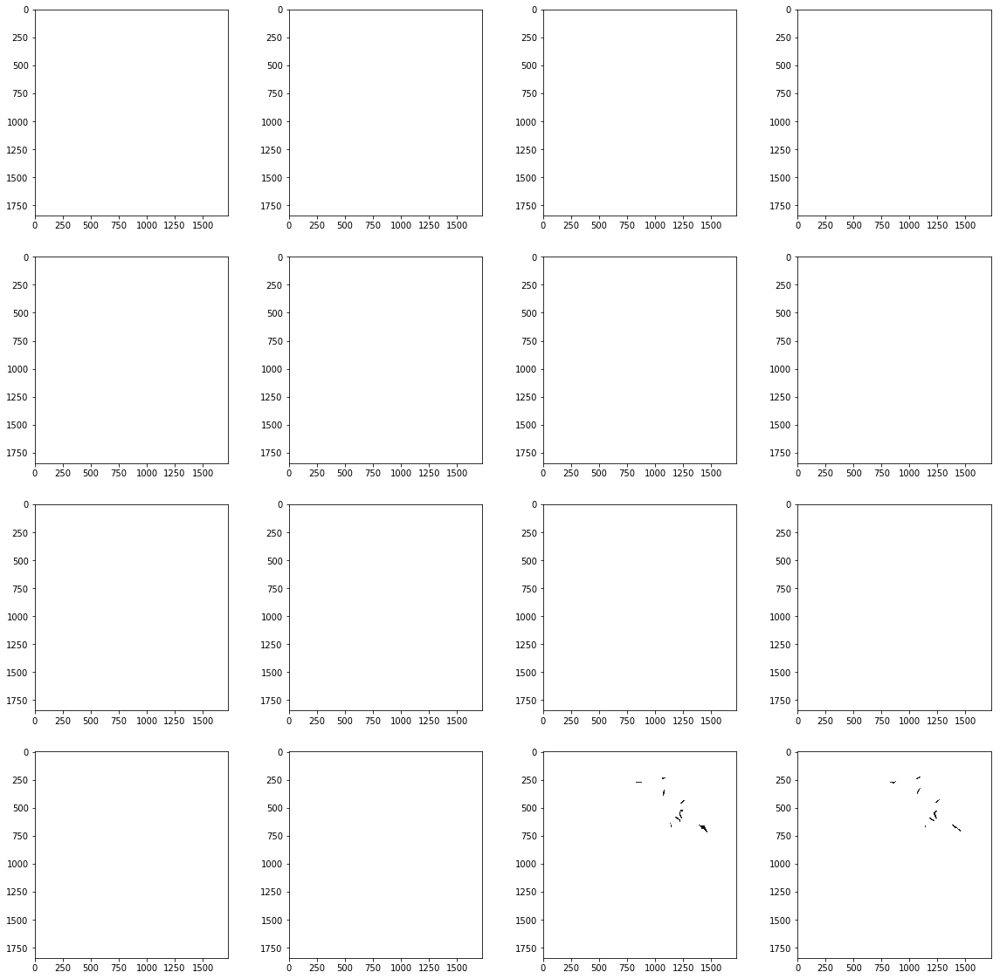

In [81]:
num=0
fig,ax = plt.subplots(4,4,figsize = (20,20))
for i in range(4):
    for j in range(4):
        ax[i,j].imshow(mask_A[num+4*i+j],cmap=cm.Greys)

In [77]:
print (rawA.shape)
print (cleftsA.shape)

(200, 3072, 3072)
(125, 1250, 1250)


In [80]:
print (img_A.shape)
print (mask_A.shape)

(153, 1842, 1727)
(153, 1842, 1727)


In [27]:
annoidsA.shape[0]

432

In [23]:
with h5py.File('data/public/sample_A_padded_20160501.hdf') as f:
    rawA = f['volumes/raw'][:]
    cleftsA = f['volumes/labels/clefts'][:]
    neuronidA = f['volumes/labels/neuron_ids'][:]

In [19]:
rawA.shape

(200, 3072, 3072)

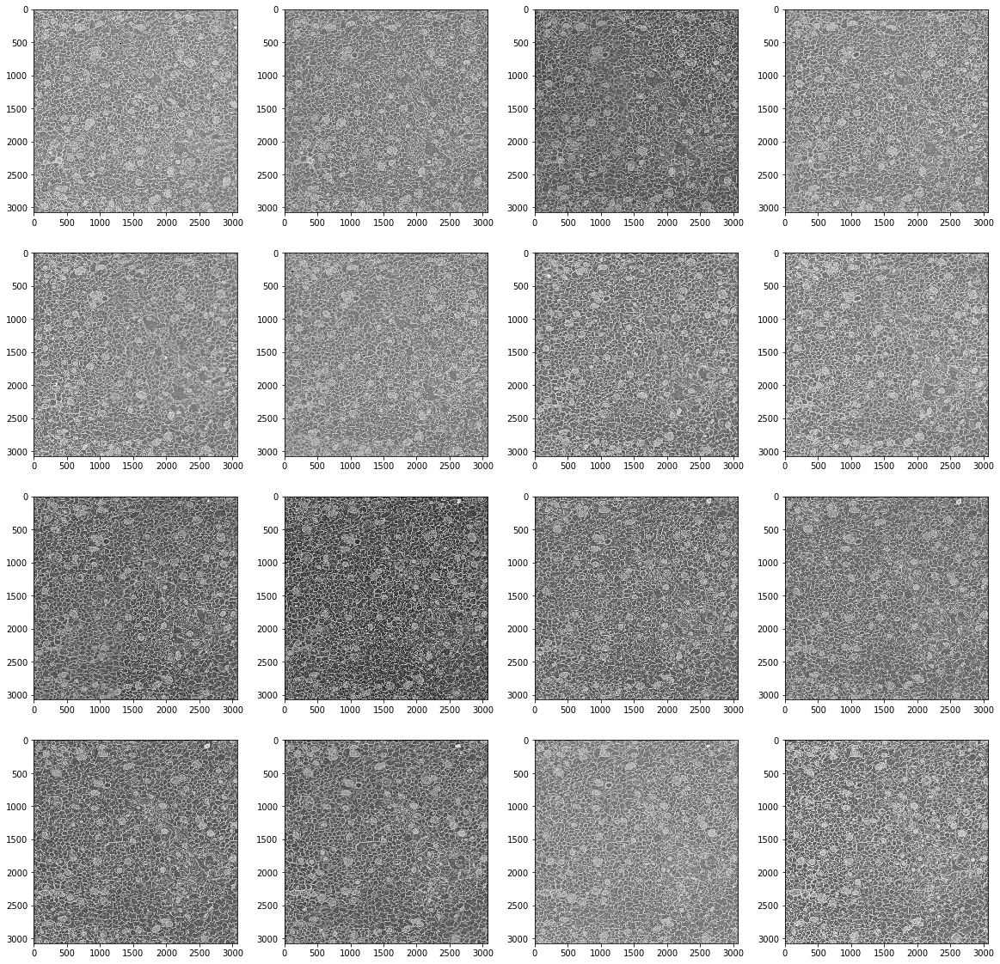

In [20]:
fig,ax = plt.subplots(4,4,figsize = (20,20))
for i in range(4):
    for j in range(4):
        ax[i,j].imshow(rawA[10+4*i+j],cmap=cm.Greys)

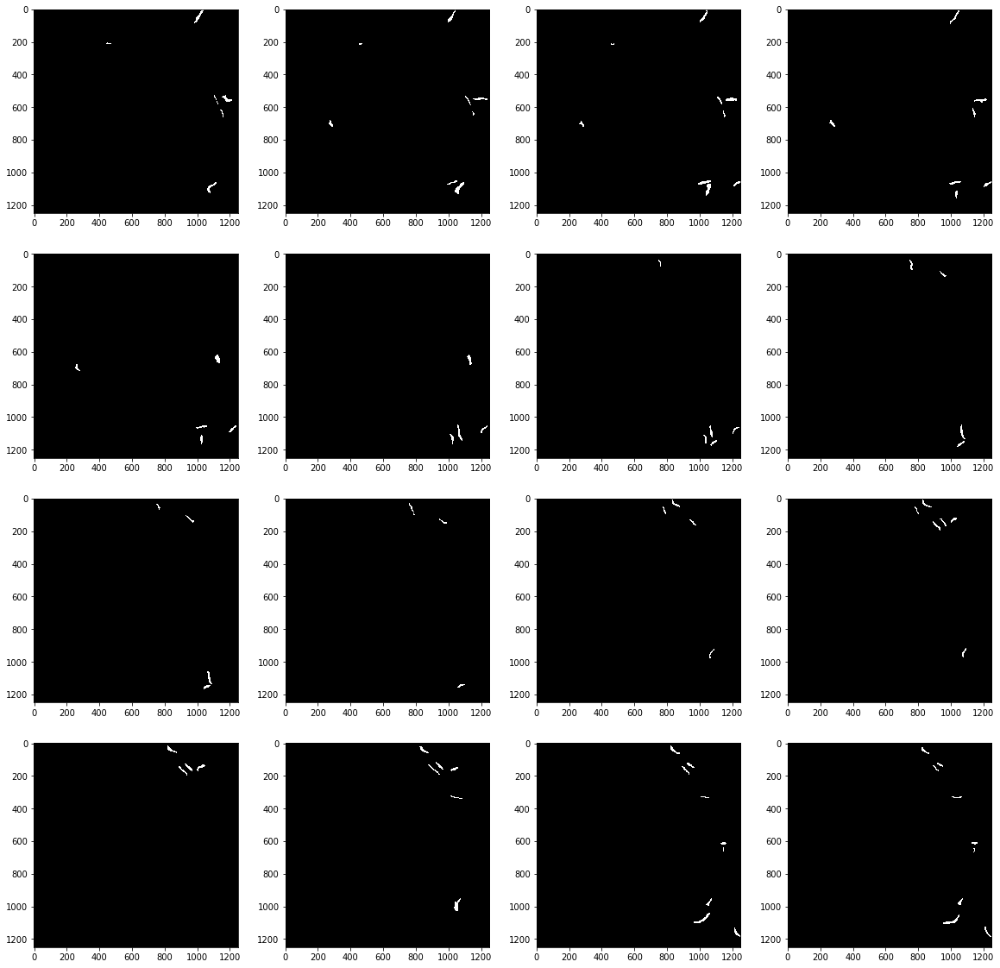

In [22]:
fig,ax = plt.subplots(4,4,figsize = (20,20))
for i in range(4):
    for j in range(4):
        ax[i,j].imshow(cleftsA[10+4*i+j],cmap=cm.Greys)

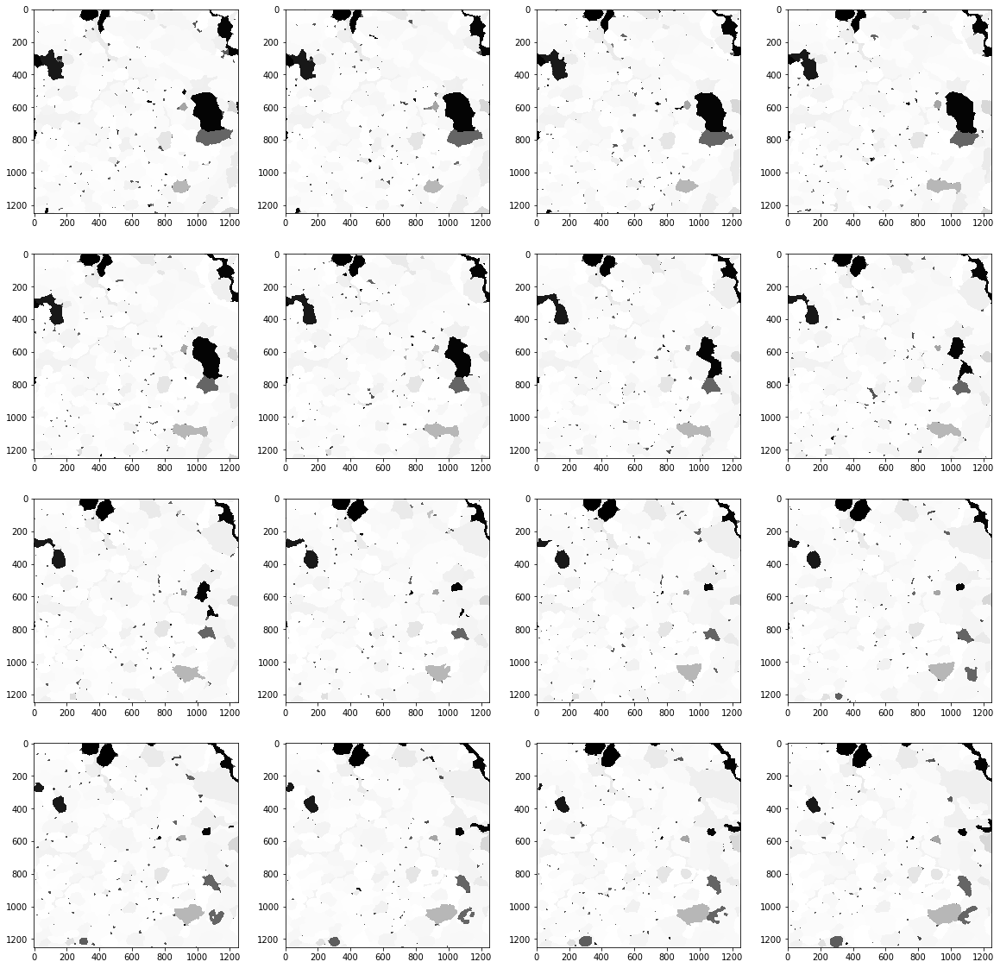

In [24]:
fig,ax = plt.subplots(4,4,figsize = (20,20))
for i in range(4):
    for j in range(4):
        ax[i,j].imshow(neuronidA[10+4*i+j],cmap=cm.Greys)